# Importing the Libraries

In [52]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
plt.style.use("fivethirtyeight")
%matplotlib inline

# For reading stock data from yahoo
from pandas_datareader.data import DataReader

# For time stamps
from datetime import datetime
from math import sqrt
from math import sqrt

from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler

#ignore the warnings
import warnings
warnings.filterwarnings('ignore')

# Loading the Data

In [54]:
KO_Data = pd.read_csv('/content/coca cola Dataset.csv')

# Basic EDA

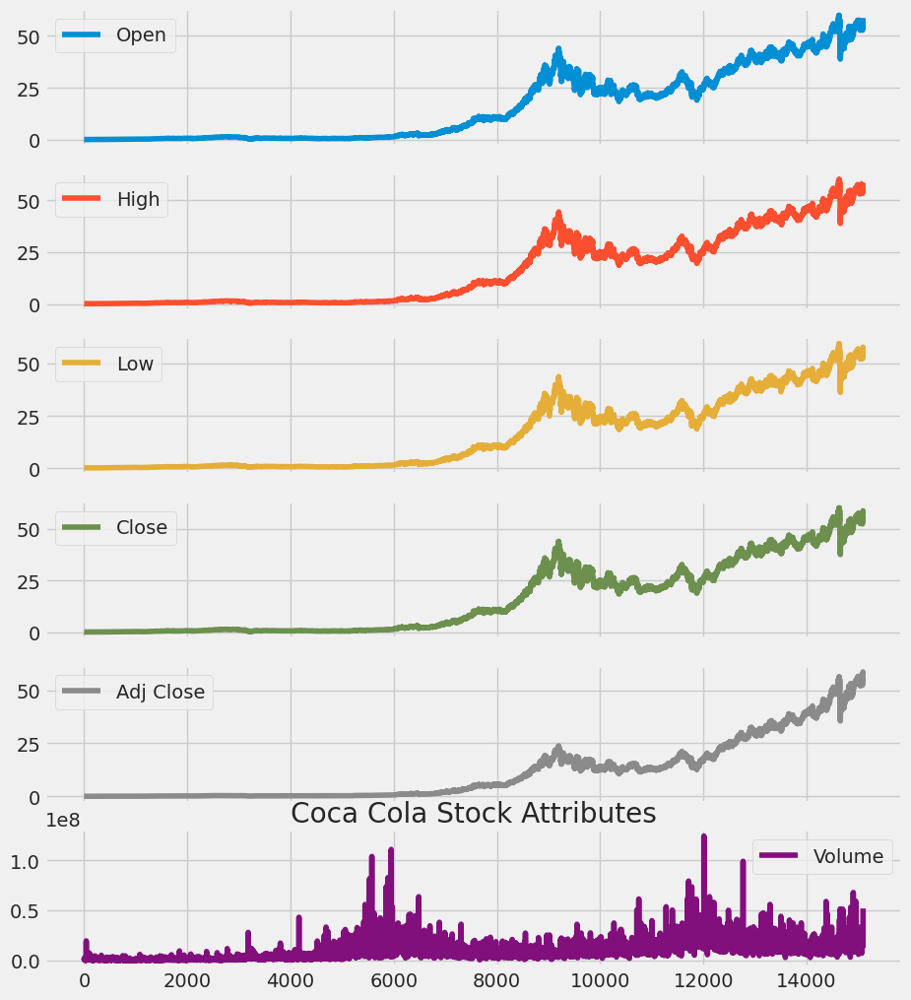

In [55]:
KO_Data.plot(subplots = True, figsize = (10,12))
plt.title('Coca Cola Stock Attributes')
plt.show()

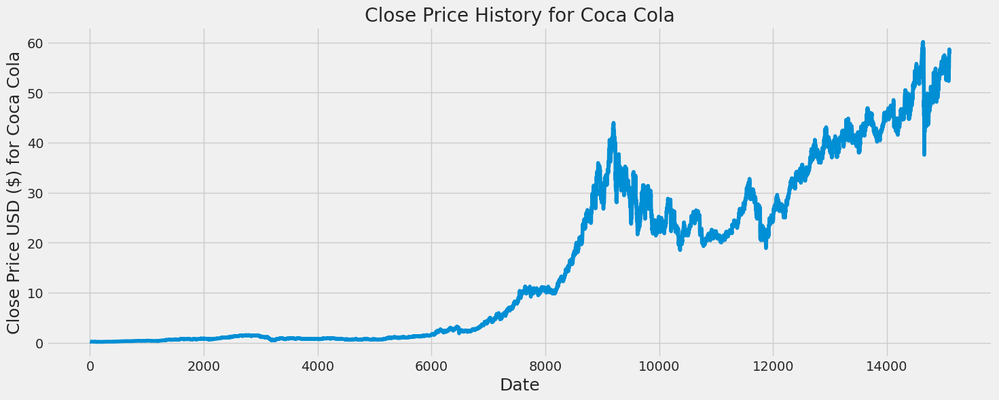

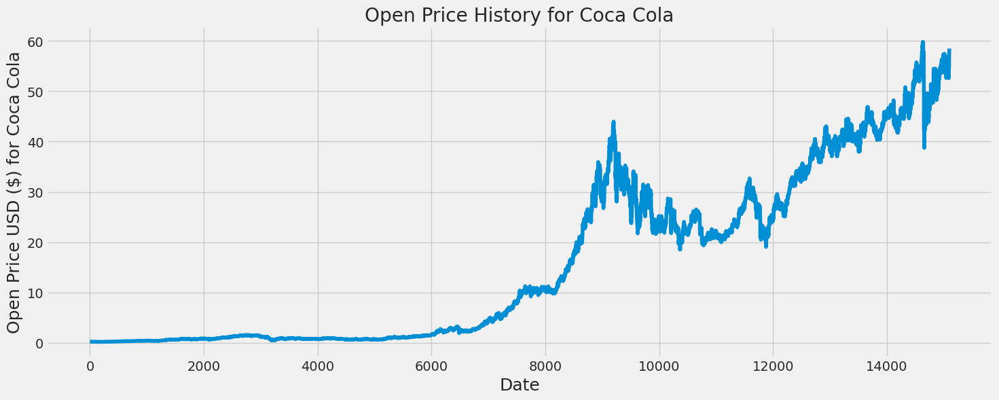

In [61]:
def plot_close_val(data_frame, column, stock):
    plt.figure(figsize=(16,6))
    plt.title(column + ' Price History for ' + stock)
    plt.plot(data_frame[column])
    plt.xlabel('Date', fontsize=18)
    plt.ylabel(column + ' Price USD ($) for ' + stock, fontsize=18)
    plt.show()

# Test the function
plot_close_val(KO_Data, 'Close', 'Coca Cola')
plot_close_val(KO_Data, 'Open', 'Coca Cola')


<Axes: >

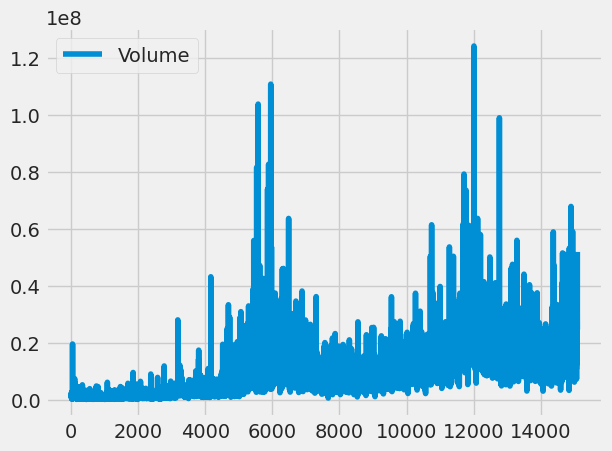

In [62]:
KO_Data[["Volume"]].plot()

# Basic Company Info

In [67]:
import pandas as pd

# Correct way to pass header and column names
ko_info = pd.read_csv('/content/Coca-Cola_stock_info.csv', header=None, names=['Description', 'Information'])

# Drop rows with any missing values
ko_info.dropna(inplace=True)

# Drop rows where 'Information' is literally the string 'nan'
ko_info.drop(ko_info[ko_info['Information'] == 'nan'].index, inplace=True)

# Sort and style
ko = ko_info.sort_values('Information').style

ko


,Description,Information
49,gmtOffSetMilliseconds,-18000000
145,bid,0
138,ask,0
77,heldPercentInsiders,0.00636
68,sharesPercentSharesOut,0.0074
100,shortPercentOfFloat,0.0074
108,trailingAnnualDividendYield,0.027917083
147,dividendYield,0.028099999
29,returnOnAssets,0.07831
75,SandP52WeekChange,0.15025425


# Basic Moving Averages

In [70]:
# Isolate the adjusted closing prices

adj_close_px = KO_Data['Close']

# Calculate the moving average
moving_avg = adj_close_px.rolling(window=40).mean()

# Inspect the result
moving_avg[-10:]

,Close
15086,55.13700
15087,55.16150
15088,55.18075
15089,55.19625
15090,55.23800
15091,55.32000
15092,55.41650
15093,55.51425
15094,55.61475
15095,55.69925


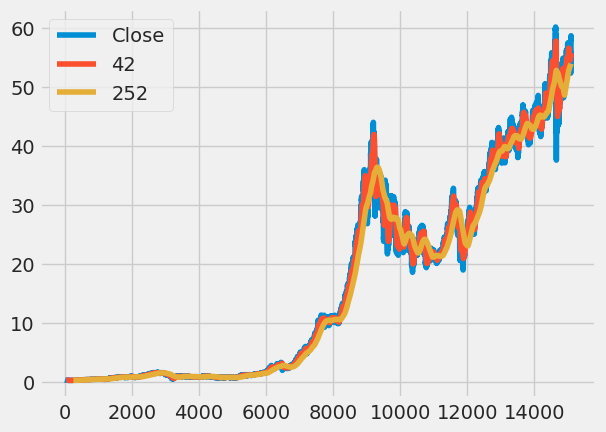

In [72]:
# Short moving window rolling mean
KO_Data['42'] = adj_close_px.rolling(window=40).mean()

# Long moving window rolling mean
KO_Data['252'] = adj_close_px.rolling(window=252).mean()

# Plot the adjusted closing price, and the short and long window rolling means
KO_Data[['Close', '42', '252']].plot()


plt.show()


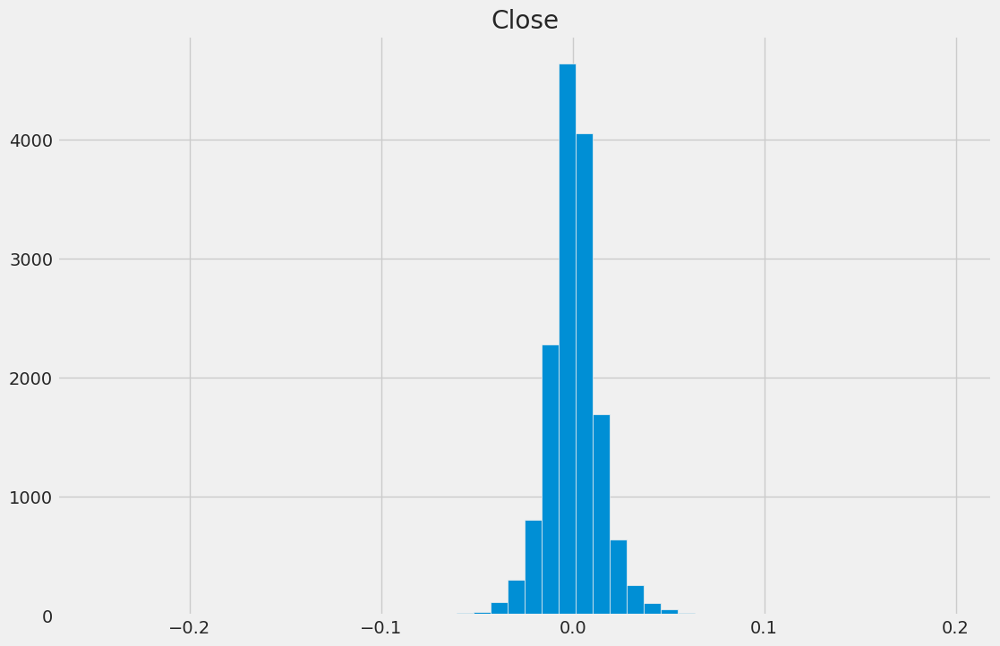

In [73]:
daily_close_px = KO_Data[['Close']]
# Calculate the daily percentage change for `daily_close_px`
daily_pct_change = daily_close_px.pct_change()

# Plot the distributions
daily_pct_change.hist(bins=50, sharex=True, figsize=(12,8))

# Show the resulting plot
plt.show()

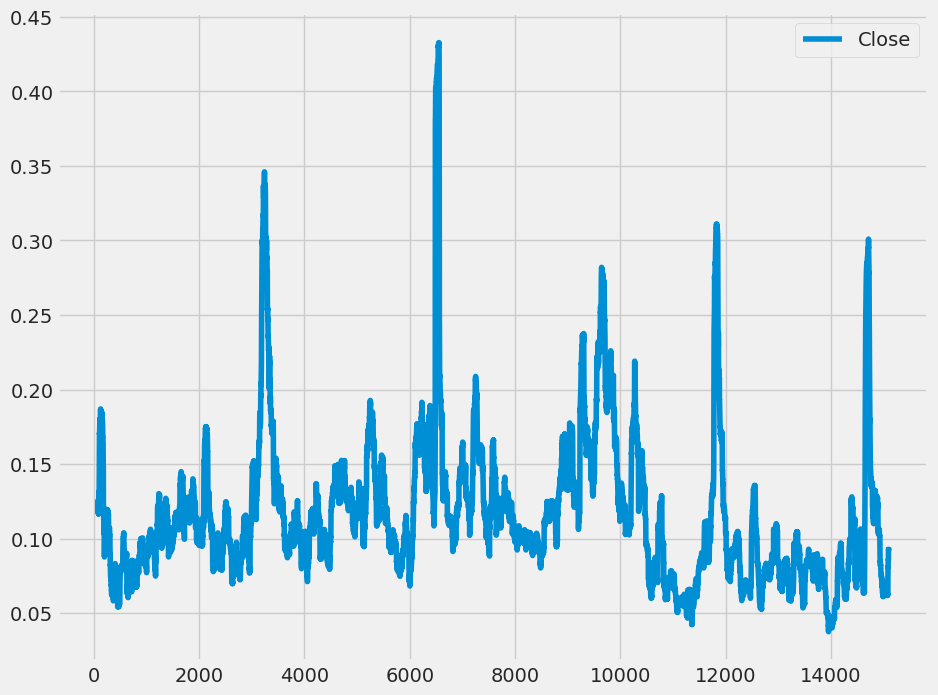

In [75]:
# Define the minumum of periods to consider
min_periods = 75

# Calculate the volatility
vol = daily_pct_change.rolling(min_periods).std() * np.sqrt(min_periods)

# Plot the volatility
vol.plot(figsize=(10, 8))

# Show the plot
plt.show()

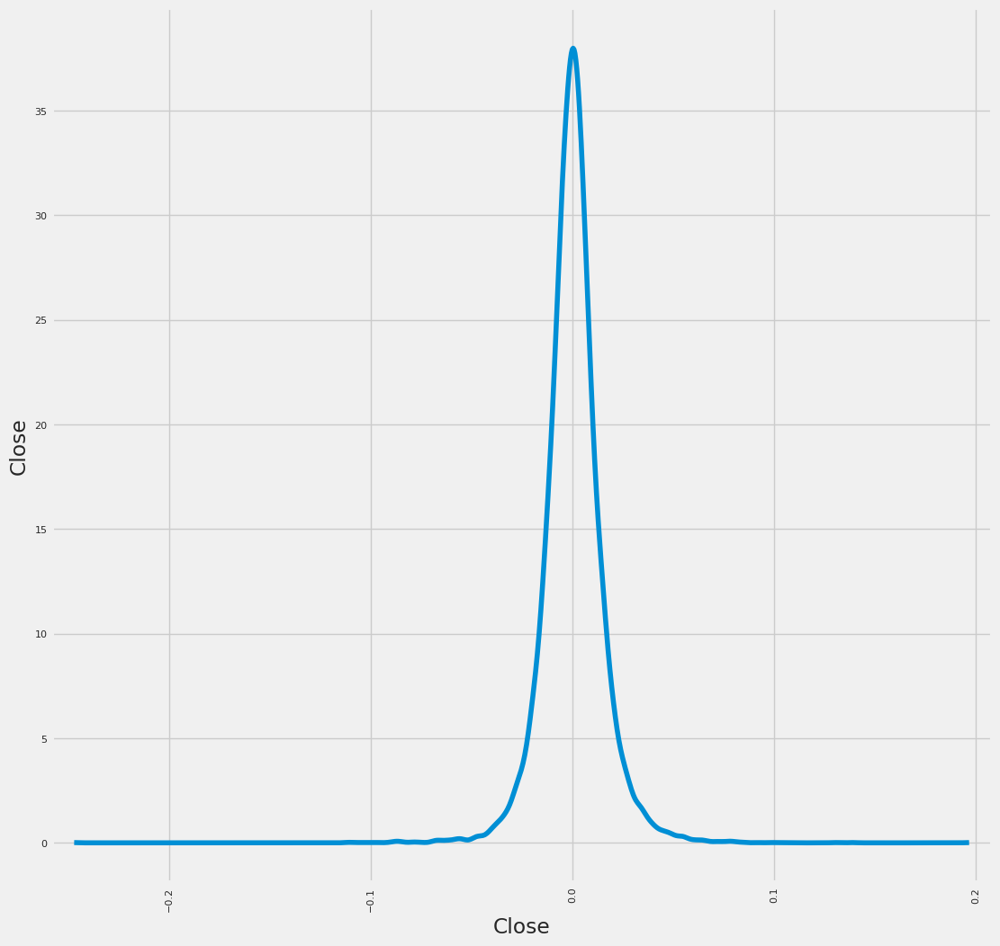

In [76]:
# Plot a scatter matrix with the `daily_pct_change` data
pd.plotting.scatter_matrix(daily_pct_change, diagonal='kde',
alpha=0.1,figsize=(12,12))

# Show the plot
plt.show()

# Basic MACD

In [77]:
import plotly.graph_objects as go

KO_Data=KO_Data.reset_index()

fig = go.Figure(data=go.Ohlc(x=KO_Data['Date'],

open=KO_Data['Open'],
high=KO_Data['High'],
low=KO_Data['Low'],
close=KO_Data['Close']))

fig.show()

# Basic SMA

In [79]:
#KO_Data=KO_Data.reset_index()

KO_Data['SMA5'] = KO_Data.Close.rolling(5).mean()
KO_Data['SMA20'] = KO_Data.Close.rolling(20).mean()
KO_Data['SMA50'] = KO_Data.Close.rolling(50).mean()
KO_Data['SMA200'] = KO_Data.Close.rolling(200).mean()
KO_Data['SMA500'] = KO_Data.Close.rolling(500).mean()

fig = go.Figure(data=[go.Ohlc(x=KO_Data['Date'],open=KO_Data['Open'],
high=KO_Data['High'],low=KO_Data['Low'],close=KO_Data['Close'],
name = "OHLC"),

go.Scatter(x=KO_Data.Date,
y=KO_Data.SMA5, line=dict(color='orange', width=1),
name="SMA5"),

go.Scatter(x=KO_Data.Date,
y=KO_Data.SMA20, line=dict(color='green', width=1),
name="SMA20"),

go.Scatter(x=KO_Data.Date,
y=KO_Data.SMA50, line=dict(color='blue', width=1),
name="SMA50"),

go.Scatter(x=KO_Data.Date,
y=KO_Data.SMA200, line=dict(color='violet', width=1),
name="SMA200"),

go.Scatter(x=KO_Data.Date,
y=KO_Data.SMA500, line=dict(color='purple', width=1),
name="SMA500")])
fig.show()

# Basic EMA

In [80]:
KO_Data['EMA5'] = KO_Data.Close.ewm(span=5,
adjust=False).mean()

KO_Data['EMA20'] = KO_Data.Close.ewm(span=20,
adjust=False).mean()
KO_Data['EMA50'] = KO_Data.Close.ewm(span=50,
adjust=False).mean()
KO_Data['EMA200'] = KO_Data.Close.ewm(span=200,
adjust=False).mean()
KO_Data['EMA500'] = KO_Data.Close.ewm(span=500,
adjust=False).mean()

fig = go.Figure(data=[go.Ohlc(x=KO_Data['Date'],
open=KO_Data['Open'],
high=KO_Data['High'],
low=KO_Data['Low'],
close=KO_Data['Close'], name =

"OHLC"),

go.Scatter(x=KO_Data.Date,
y=KO_Data.SMA5, line=dict(color='orange', width=1),
name="EMA5"),

go.Scatter(x=KO_Data.Date,
y=KO_Data.SMA20, line=dict(color='green', width=1),
name="EMA20"),

go.Scatter(x=KO_Data.Date,
y=KO_Data.SMA50, line=dict(color='blue', width=1),
name="EMA50"),

go.Scatter(x=KO_Data.Date,

y=KO_Data.SMA200, line=dict(color='violet', width=1),
name="EMA200"),

go.Scatter(x=KO_Data.Date,
y=KO_Data.SMA500, line=dict(color='purple', width=1),
name="EMA500")])
fig.show()

In [81]:
KO_Data.head()
#KO_Data.fillna(0)
#KO_Data.set_index('Date')

,index,Date,Open,High,Low,Close,Adj Close,Volume,42,252,SMA5,SMA20,SMA50,SMA200,SMA500,EMA5,EMA20,EMA50,EMA200,EMA500
0,0,1962-01-02,0.263021,0.270182,0.263021,0.263021,0.051133,806400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.263021,0.263021,0.263021,0.263021,0.263021
1,1,1962-01-03,0.259115,0.259115,0.253255,0.257161,0.049994,1574400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.261068,0.262463,0.262791,0.262963,0.262998
2,2,1962-01-04,0.257813,0.261068,0.257813,0.259115,0.050374,844800,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.260417,0.262144,0.262647,0.262924,0.262982
3,3,1962-01-05,0.259115,0.262370,0.252604,0.253255,0.049234,1420800,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.258030,0.261297,0.262279,0.262828,0.262943
4,4,1962-01-08,0.251302,0.251302,0.245768,0.250651,0.048728,2035200,NaN,NaN,0.256641,NaN,NaN,NaN,NaN,0.255570,0.260284,0.261823,0.262707,0.262894


# Finta Tech Analysis

In [84]:
# # FINTA Tech Analysis Ratios
# # Let us do a financial ratios calculation using FINTA library

# # ● Simple Moving Average 'SMA'
# # ● Simple Moving Median 'SMM'
# # ● Smoothed Simple Moving Average 'SSMA'
# # ● Exponential Moving Average 'EMA'
# # ● Double Exponential Moving Average 'DEMA'
# # ● Triple Exponential Moving Average 'TEMA'
# # ● Triangular Moving Average 'TRIMA'
# # ● Triple Exponential Moving Average Oscillator 'TRIX'
# # ● Volume Adjusted Moving Average 'VAMA'
# # ● Kaufman Efficiency Indicator 'ER'
# # ● Kaufman's Adaptive Moving Average 'KAMA'
# # ● Zero Lag Exponential Moving Average 'ZLEMA'
# # ● Weighted Moving Average 'WMA'
# # ● Hull Moving Average 'HMA'
# # ● Elastic Volume Moving Average 'EVWMA'

# # ● Volume Weighted Average Price 'VWAP'
# # ● Smoothed Moving Average 'SMMA'
# # ● Fractal Adaptive Moving Average 'FRAMA'
# # ● Moving Average Convergence Divergence 'MACD'
# # ● Percentage Price Oscillator 'PPO'
# # ● Volume-Weighted MACD 'VW_MACD'
# # ● Elastic-Volume weighted MACD 'EV_MACD'
# # ● Market Momentum 'MOM'
# # ● Rate-of-Change 'ROC'
# # ● Relative Strenght Index 'RSI'
# # ● Inverse Fisher Transform RSI 'IFT_RSI'
# # ● True Range 'TR'
# # ● Average True Range 'ATR'
# # ● Stop-and-Reverse 'SAR'
# # ● Bollinger Bands 'BBANDS'
# # ● Bollinger Bands Width 'BBWIDTH'
# # ● Momentum Breakout Bands 'MOBO'
# # ● Percent B 'PERCENT_B'
# # ● Keltner Channels 'KC'
# # ● Donchian Channel 'DO'
# # ● Directional Movement Indicator 'DMI'
# # ● Average Directional Index 'ADX'
# # ● Pivot Points 'PIVOT'
# # ● Fibonacci Pivot Points 'PIVOT_FIB'
# # ● Stochastic Oscillator %K 'STOCH'
# # ● Stochastic oscillator %D 'STOCHD'
# # ● Stochastic RSI 'STOCHRSI'
# # ● Williams %R 'WILLIAMS'
# # ● Ultimate Oscillator 'UO'

# # ● Awesome Oscillator 'AO'
# # ● Mass Index 'MI'
# # ● Vortex Indicator 'VORTEX'
# # ● Know Sure Thing 'KST'
# # ● True Strength Index 'TSI'
# # ● Typical Price 'TP'
# # ● Accumulation-Distribution Line 'ADL'
# # ● Chaikin Oscillator 'CHAIKIN'
# # ● Money Flow Index 'MFI'
# # ● On Balance Volume 'OBV'
# # ● Weighter OBV 'WOBV'
# # ● Volume Zone Oscillator 'VZO'
# # ● Price Zone Oscillator 'PZO'
# # ● Elder's Force Index 'EFI'
# # ● Cummulative Force Index 'CFI'
# # ● Bull power and Bear Power 'EBBP'
# # ● Ease of Movement 'EMV'
# # ● Commodity Channel Index 'CCI'
# # ● Coppock Curve 'COPP'
# # ● Buy and Sell Pressure 'BASP'
# # ● Normalized BASP 'BASPN'
# # ● Chande Momentum Oscillator 'CMO'
# # ● Chandelier Exit 'CHANDELIER'
# # ● Qstick 'QSTICK'
# # ● Twiggs Money Index 'TMF'
# # ● Wave Trend Oscillator 'WTO'
# # ● Fisher Transform 'FISH'
# # ● Ichimoku Cloud 'ICHIMOKU'
# # ● Adaptive Price Zone 'APZ'

# # ● Squeeze Momentum Indicator 'SQZMI'
# # ● Volume Price Trend 'VPT'
# # ● Finite Volume Element 'FVE'
# # ● Volume Flow Indicator 'VFI'
# # ● Moving Standard deviation 'MSD'
# # ● Schaff Trend Cycle 'STC'


In [86]:
try:
  from finta import TA
  from backtesting import Backtest, Strategy
  from backtesting.lib import crossover
except:
  !pip install finta backtesting
  from finta import TA
  from backtesting import Backtest, Strategy
  from backtesting.lib import crossover

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 191.4/191.4 kB 5.3 MB/s eta 0:00:00


In [89]:
fin_ma = pd.read_csv('/content/coca cola Dataset.csv', parse_dates=True)
print(fin_ma.head())
ohlc=fin_ma
print(TA.SMA(ohlc, 42))
#ohlc.index = ohlc[index].dt.date

         Date      Open      High       Low     Close  Adj Close   Volume
0  1962-01-02  0.263021  0.270182  0.263021  0.263021   0.051133   806400
1  1962-01-03  0.259115  0.259115  0.253255  0.257161   0.049994  1574400
2  1962-01-04  0.257813  0.261068  0.257813  0.259115   0.050374   844800
3  1962-01-05  0.259115  0.262370  0.252604  0.253255   0.049234  1420800
4  1962-01-08  0.251302  0.251302  0.245768  0.250651   0.048728  2035200
0              NaN
1              NaN
2              NaN
3              NaN
4              NaN
           ...    
15091    55.283095
15092    55.359048
15093    55.444286
15094    55.556429
15095    55.641667
Name: 42 period SMA, Length: 15096, dtype: float64


In [90]:
# Cleaned function dictionary
function_dict = {
    'Simple Moving Average': 'SMA',
    'Simple Moving Median': 'SMM',
    'Smoothed Simple Moving Average': 'SSMA',
    'Exponential Moving Average': 'EMA',
    'Double Exponential Moving Average': 'DEMA',
    'Triple Exponential Moving Average': 'TEMA',
    'Triangular Moving Average': 'TRIMA',
    'Triple Exponential Moving Average Oscillator': 'TRIX',
    'Volume Adjusted Moving Average': 'VAMA',
    'Kaufman Efficiency Indicator': 'ER',
    'Kaufmans Adaptive Moving Average': 'KAMA',
    'Zero Lag Exponential Moving Average': 'ZLEMA',
    'Weighted Moving Average': 'WMA',
    'Hull Moving Average': 'HMA',
    'Elastic Volume Moving Average': 'EVWMA',
    'Volume Weighted Average Price': 'VWAP',
    'Smoothed Moving Average': 'SMMA',
    'Fractal Adaptive Moving Average': 'FRAMA',
    'Moving Average Convergence Divergence': 'MACD',
    'Percentage Price Oscillator': 'PPO',
    'Volume-Weighted MACD': 'VW_MACD',
    'Elastic-Volume weighted MACD': 'EV_MACD',
    'Market Momentum': 'MOM',
    'Rate-of-Change': 'ROC',
    'Relative Strength Index': 'RSI',
    'Inverse Fisher Transform RSI': 'IFT_RSI',
    'True Range': 'TR',
    'Average True Range': 'ATR',
    'Stop-and-Reverse': 'SAR',
    'Bollinger Bands': 'BBANDS',
    'Bollinger Bands Width': 'BBWIDTH',
    'Momentum Breakout Bands': 'MOBO',
    'Percent B': 'PERCENT_B',
    'Keltner Channels': 'KC',
    'Donchian Channel': 'DO',
    'Directional Movement Indicator': 'DMI',
    'Average Directional Index': 'ADX',
    'Pivot Points': 'PIVOT',
    'Fibonacci Pivot Points': 'PIVOT_FIB',
    'Stochastic Oscillator Percent K': 'STOCH',
    'Stochastic oscillator Percent D': 'STOCHD',
    'Stochastic RSI': 'STOCHRSI',
    'Williams Percent R': 'WILLIAMS',
    'Ultimate Oscillator': 'UO',
    'Awesome Oscillator': 'AO',
    'Mass Index': 'MI',
    'Know Sure Thing': 'KST',
    'True Strength Index': 'TSI',
    'Typical Price': 'TP',
    'Accumulation-Distribution Line': 'ADL',
    'Chaikin Oscillator': 'CHAIKIN',
    'Money Flow Index': 'MFI',
    'On Balance Volume': 'OBV',
    'Weighter OBV': 'WOBV',
    'Volume Zone Oscillator': 'VZO',
    'Price Zone Oscillator': 'PZO',
    'Elders Force Index': 'EFI',
    'Cummulative Force Index': 'CFI',
    'Bull power and Bear Power': 'EBBP',
    'Ease of Movement': 'EMV',
    'Commodity Channel Index': 'CCI',
    'Coppock Curve': 'COPP',
    'Buy and Sell Pressure': 'BASP',
    'Normalized BASP': 'BASPN',
    'Chande Momentum Oscillator': 'CMO',
    'Chandelier Exit': 'CHANDELIER',
    'Qstick': 'QSTICK',
    'Wave Trend Oscillator': 'WTO',
    'Fisher Transform': 'FISH',
    'Ichimoku Cloud': 'ICHIMOKU',
    'Adaptive Price Zone': 'APZ',
    'Volume Price Trend': 'VPT',
    'Finite Volume Element': 'FVE',
    'Volume Flow Indicator': 'VFI',
    'Moving Standard deviation': 'MSD',
    'Schaff Trend Cycle': 'STC'
}


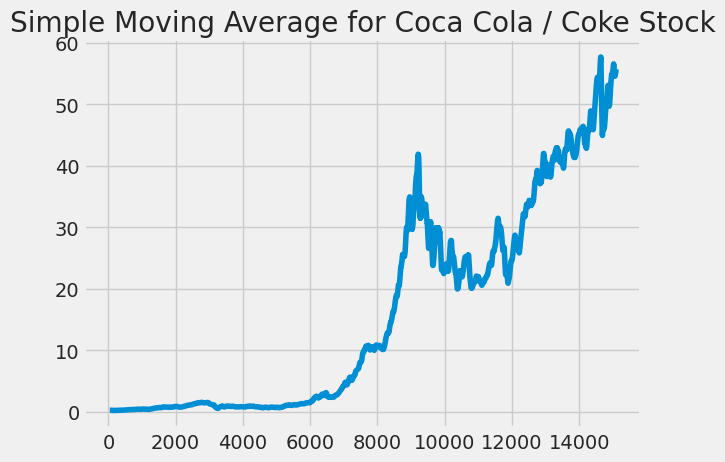

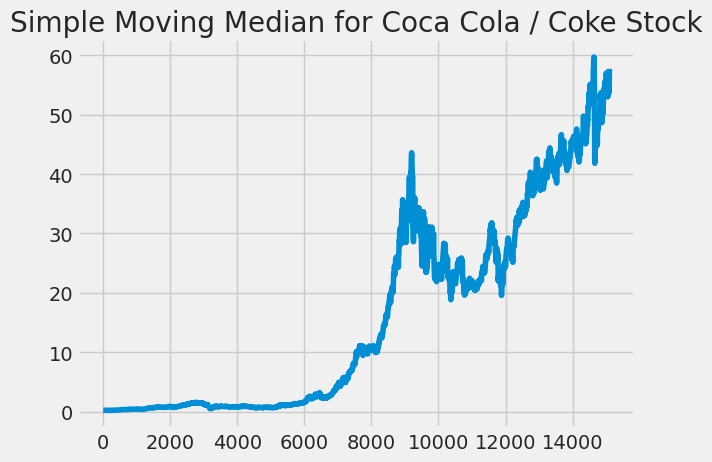

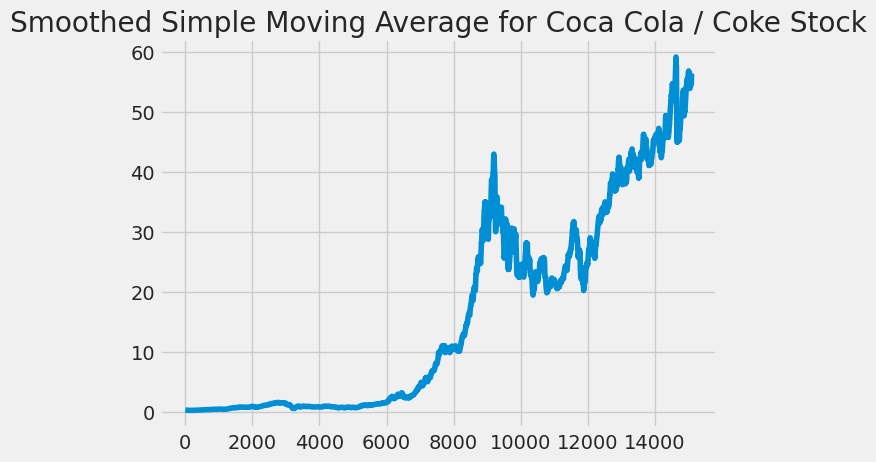

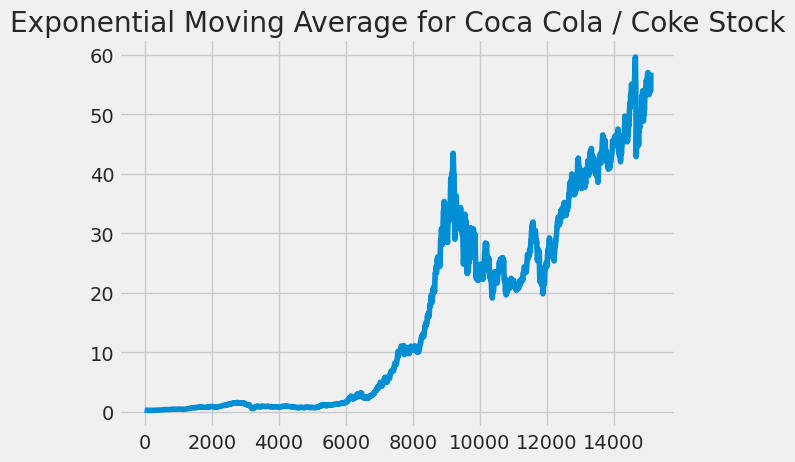

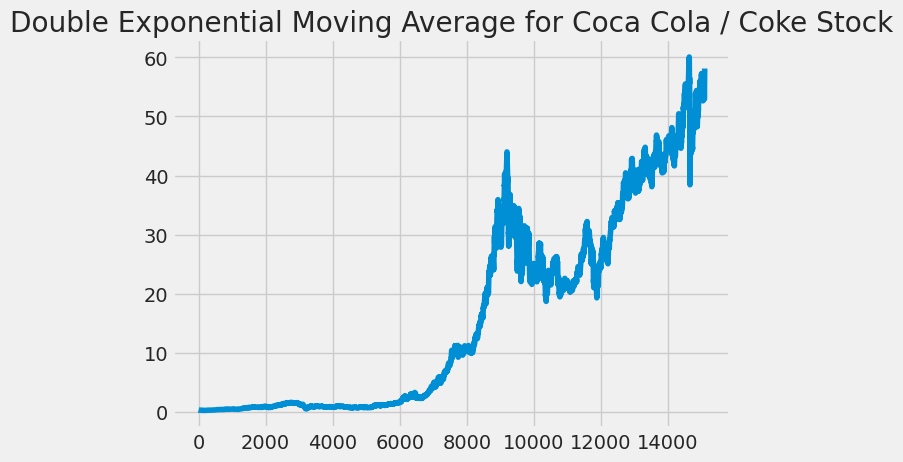

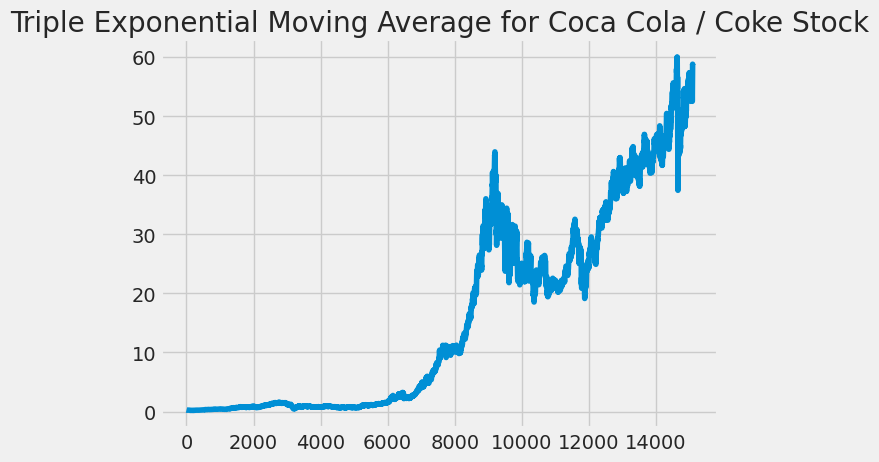

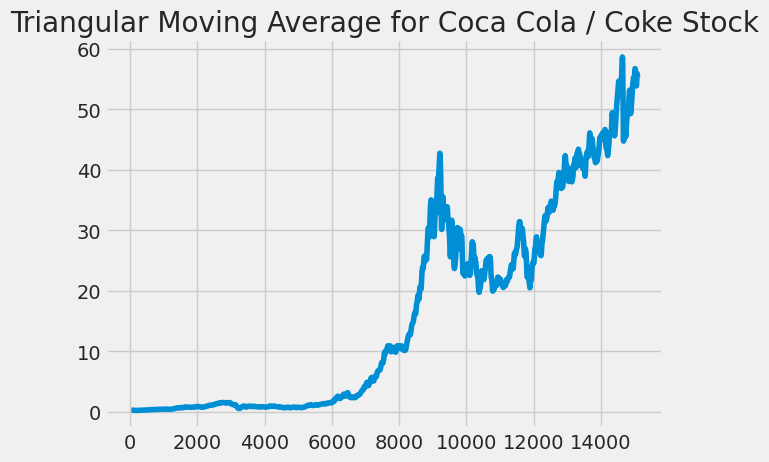

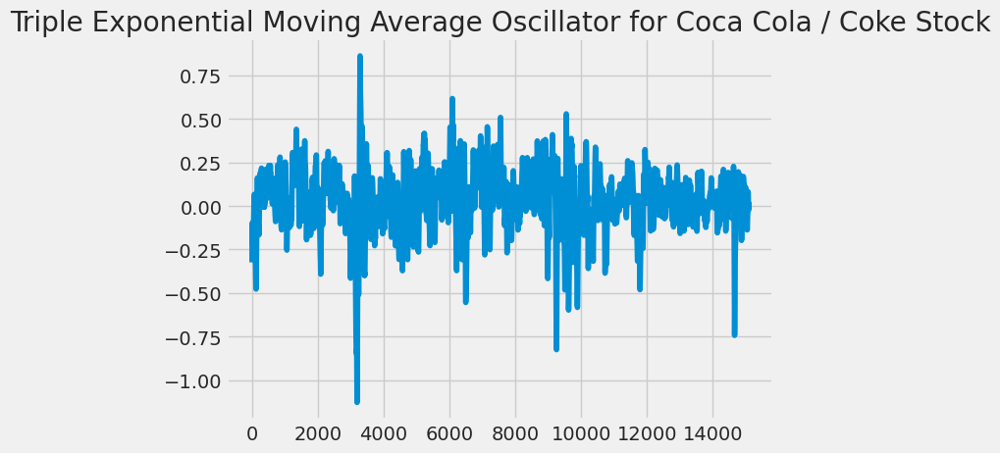

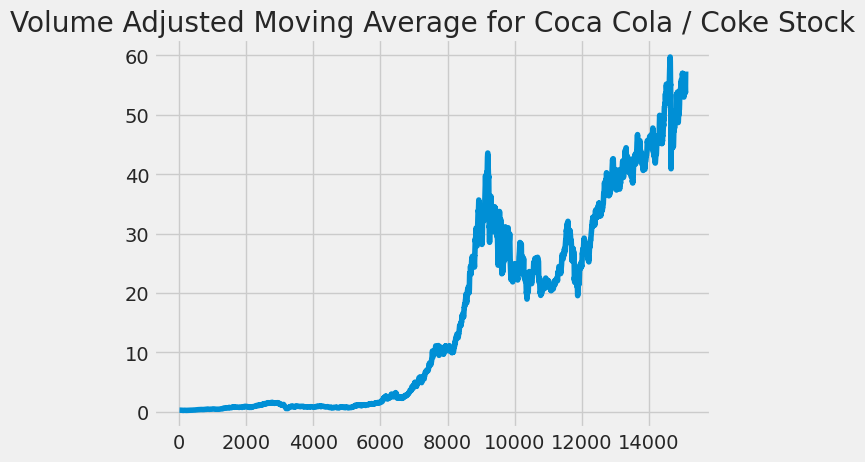

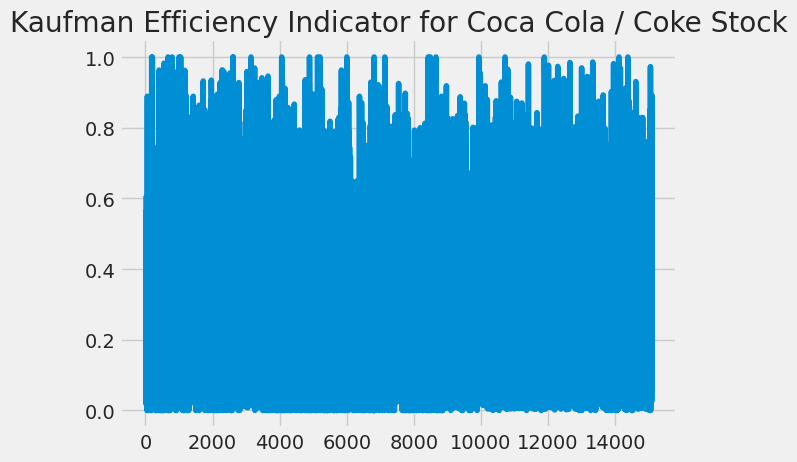

Failed for Kaufmans Adaptive Moving Average: 'Series' object has no attribute 'iteritems'


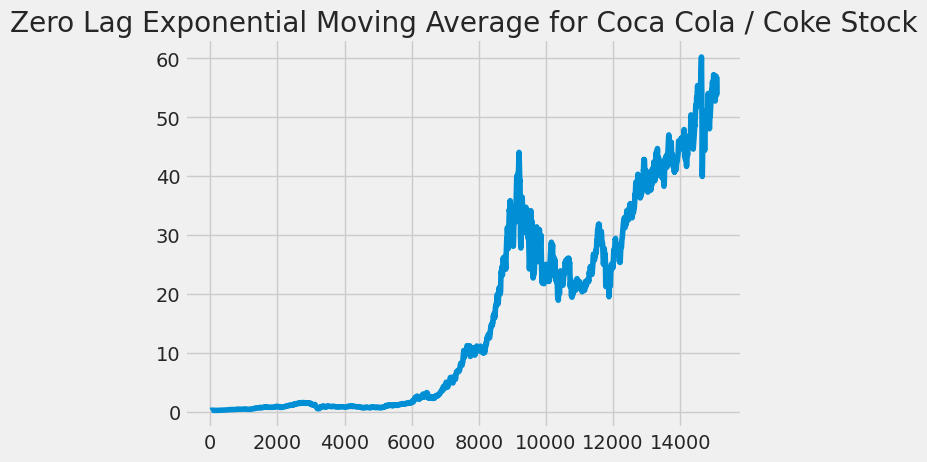

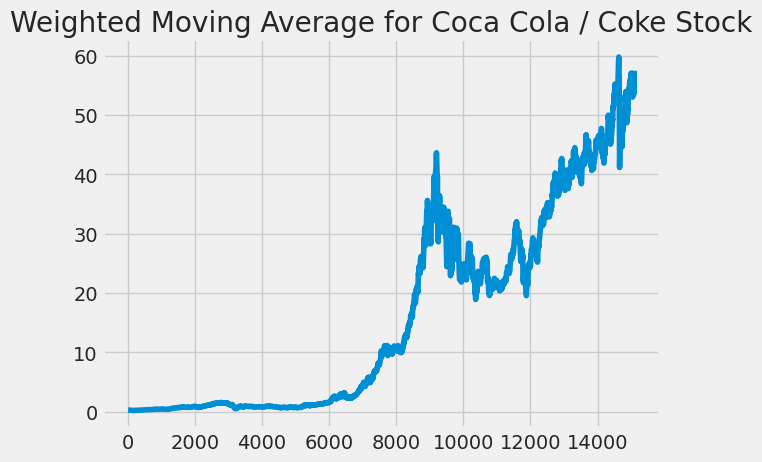

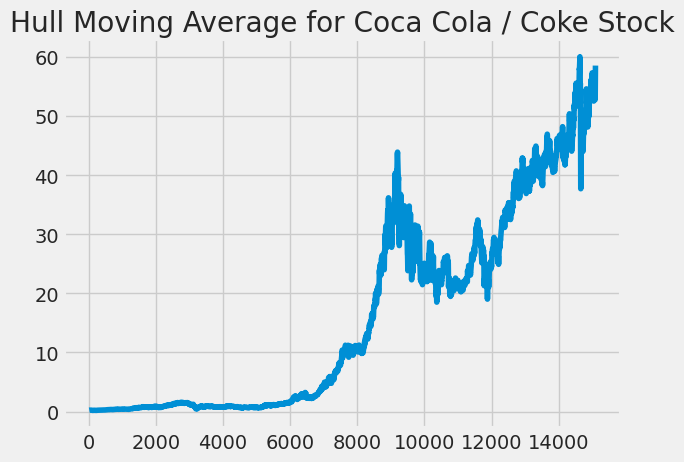

Failed for Elastic Volume Moving Average: 'Series' object has no attribute 'iteritems'


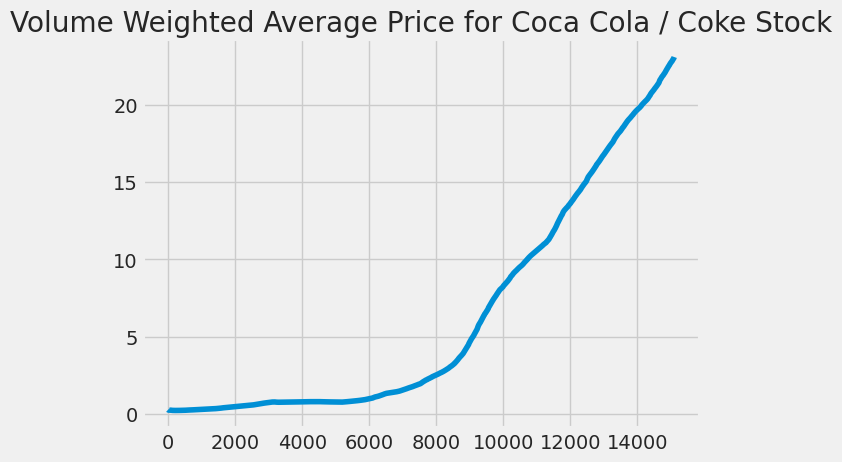

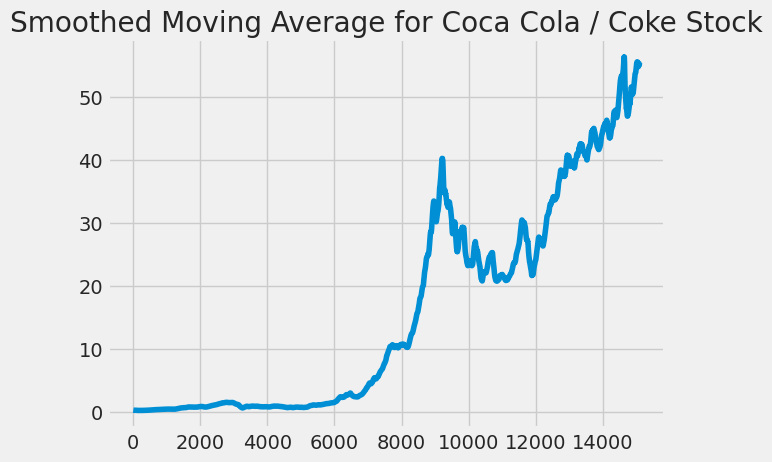

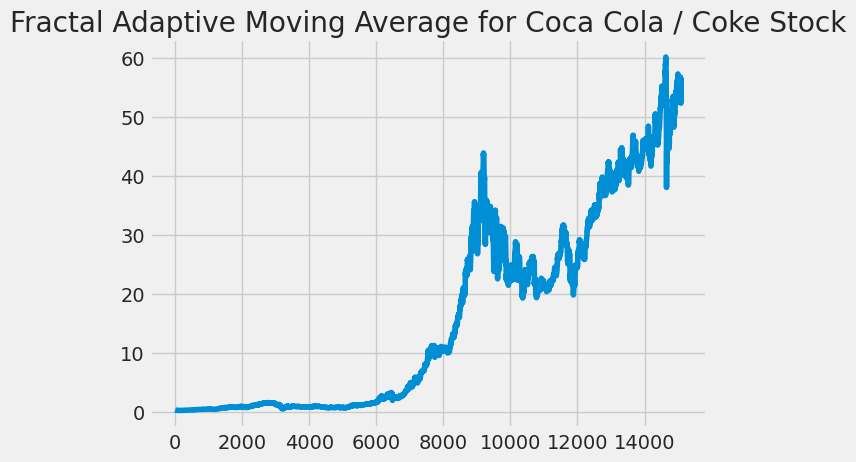

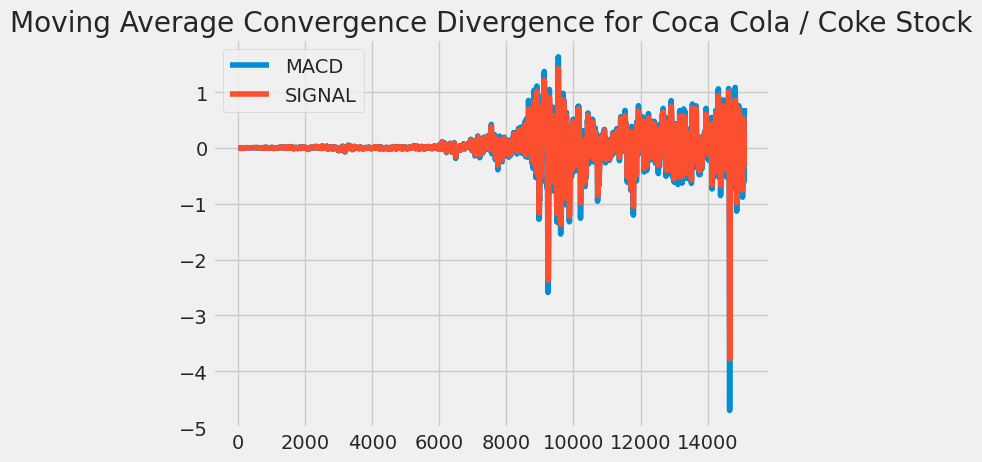

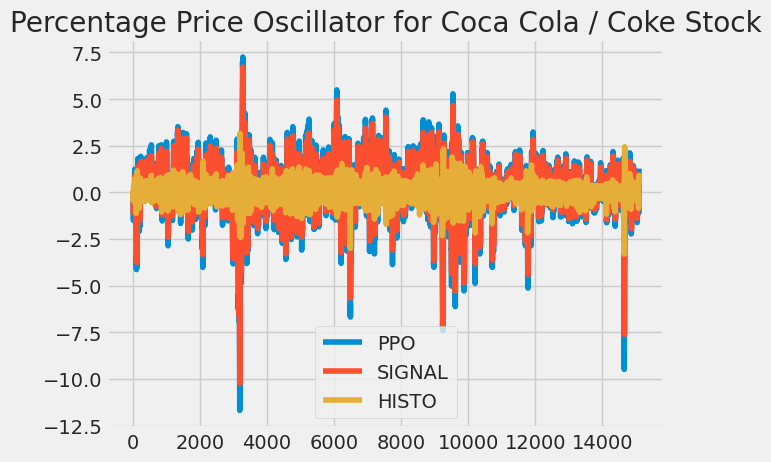

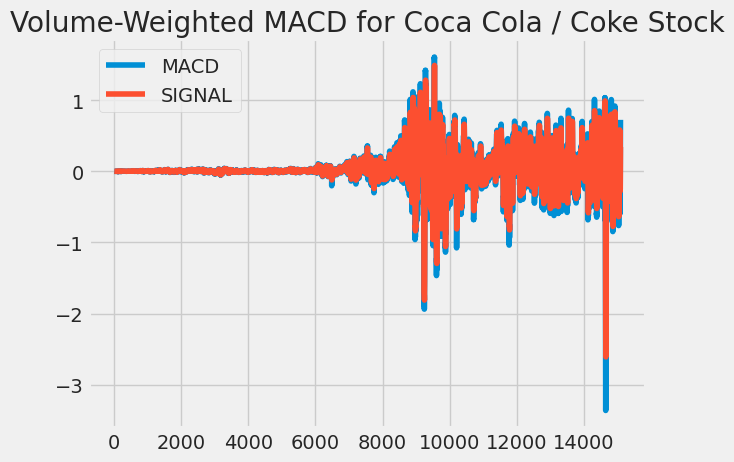

Failed for Elastic-Volume weighted MACD: 'Series' object has no attribute 'iteritems'


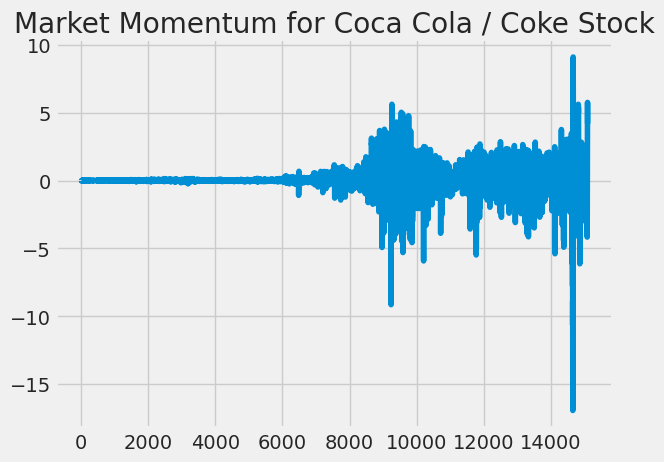

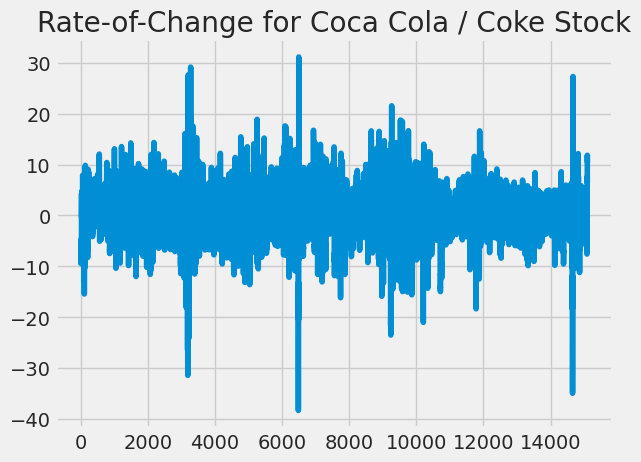

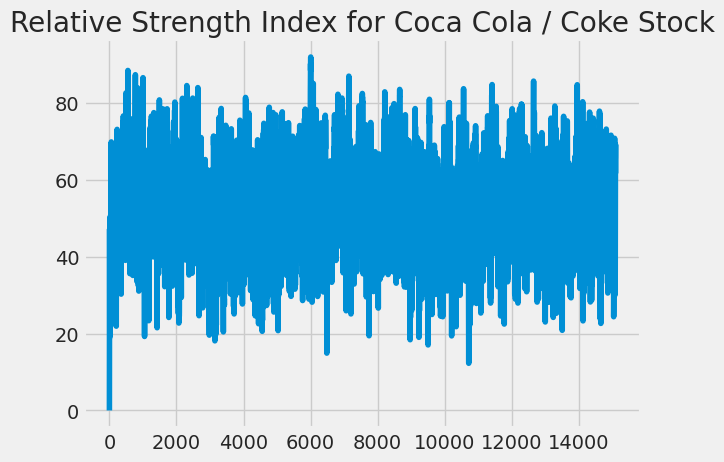

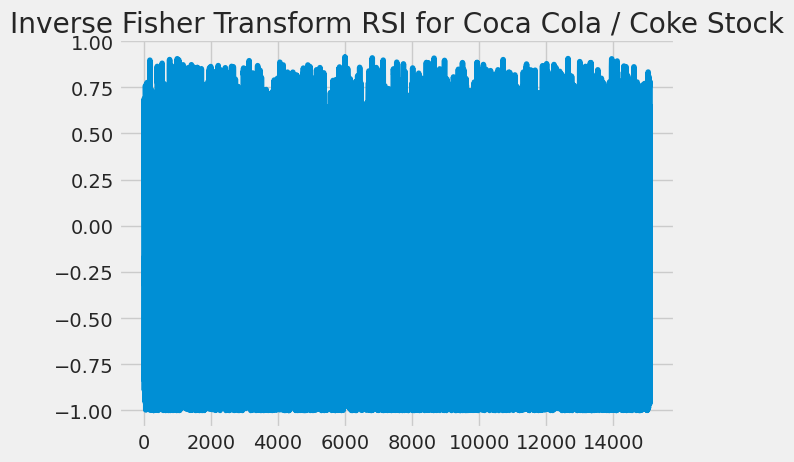

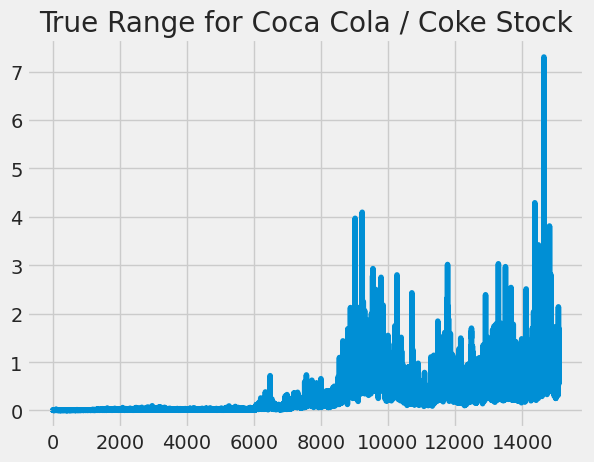

...

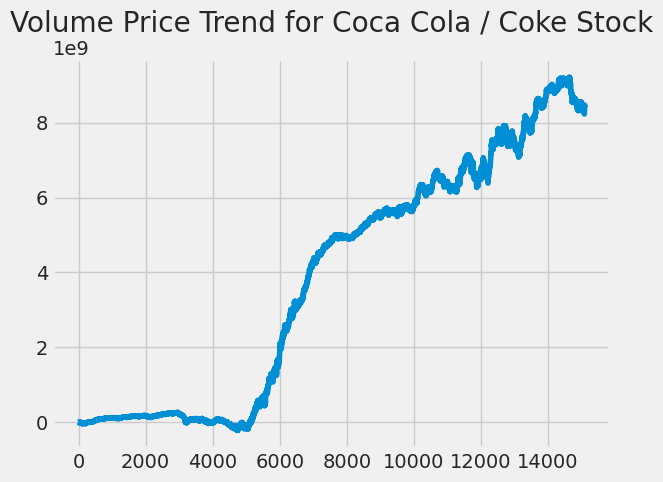

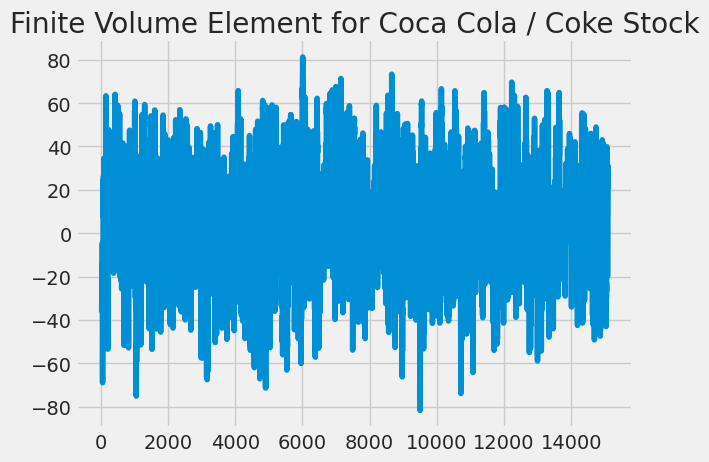

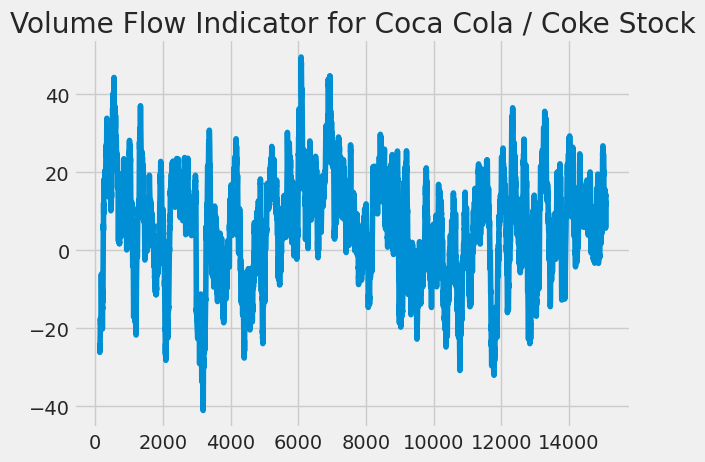

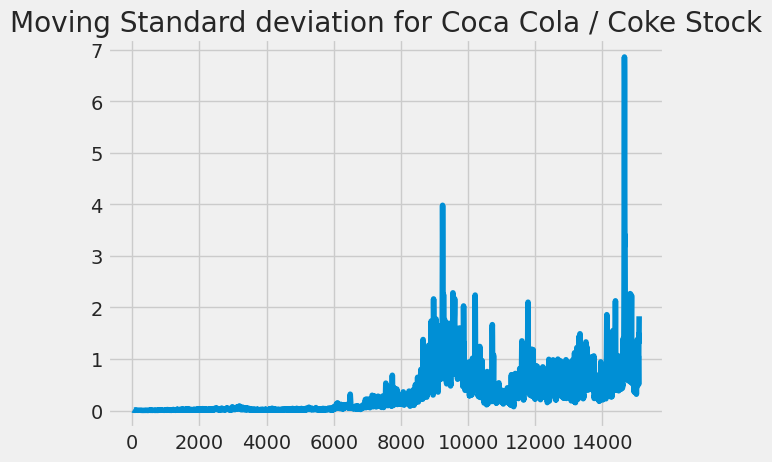

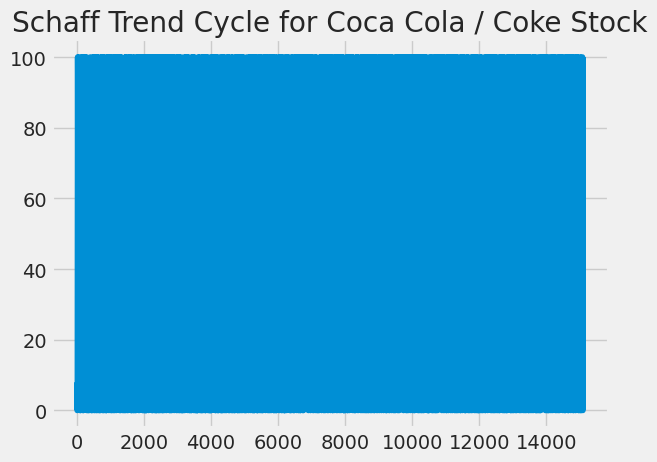

In [91]:
import matplotlib.pyplot as plt
from finta import TA

for key, value in function_dict.items():
    try:
        result = getattr(TA, value)(ohlc)
        result.plot(title=f"{key} for Coca Cola / Coke Stock")
        plt.show()
    except Exception as e:
        print(f"Failed for {key}: {e}")


# Back Testing Trading Stratergy

In [99]:
from backtesting import Strategy
from backtesting.lib import crossover
from backtesting.test import SMA

In [110]:
def BBANDS(data, n_lookback, n_std):
    """Bollinger Bands indicator using HLC3 (average of High, Low, Close)"""
    hlc3 = (data.High + data.Low + data.Close) / 3
    mean = hlc3.rolling(n_lookback).mean()
    std = hlc3.rolling(n_lookback).std()

    upper = mean + n_std * std
    lower = mean - n_std * std
    return upper, lower

In [111]:
close = KO_Data.Close.values
sma10 = SMA(KO_Data.Close, 10)
sma20 = SMA(KO_Data.Close, 20)
sma50 = SMA(KO_Data.Close, 50)
sma100 = SMA(KO_Data.Close, 100)
upper, lower = BBANDS(KO_Data, 20, 2)

In [112]:
# Design matrix / independent features:

# Price-derived features
data['X_SMA10'] = (close - sma10) / close
data['X_SMA20'] = (close - sma20) / close
data['X_SMA50'] = (close - sma50) / close
data['X_SMA100'] = (close - sma100) / close

data['X_DELTA_SMA10'] = (sma10 - sma20) / close
data['X_DELTA_SMA20'] = (sma20 - sma50) / close
data['X_DELTA_SMA50'] = (sma50 - sma100) / close

In [114]:
# Indicator features
data['X_MOM'] = data.Close.pct_change(periods=2)
data['X_BB_upper'] = (upper - close) / close
data['X_BB_lower'] = (lower - close) / close
data['X_BB_width'] = (upper - lower) / close


In [115]:
from backtesting import Strategy
from backtesting.lib import crossover
from backtesting.test import SMA  # Or from your custom SMA implementation

class Sma4Cross(Strategy):
    n1 = 50
    n2 = 100
    n_enter = 20
    n_exit = 10

    def init(self):
        self.sma1 = self.I(SMA, self.data.Close, self.n1)
        self.sma2 = self.I(SMA, self.data.Close, self.n2)
        self.sma_enter = self.I(SMA, self.data.Close, self.n_enter)
        self.sma_exit = self.I(SMA, self.data.Close, self.n_exit)

    def next(self):
        if not self.position:
            # On upwards trend, if price closes above "entry" MA, go long
            if self.sma1 > self.sma2:
                if crossover(self.data.Close, self.sma_enter):
                    self.buy()
            # On downwards trend, if price closes below "entry" MA, go short
            else:
                if crossover(self.sma_enter, self.data.Close):
                    self.sell()
        else:
            # Exit if price crosses the "exit" MA
            if (self.position.is_long and crossover(self.sma_exit, self.data.Close)) or \
               (self.position.is_short and crossover(self.data.Close, self.sma_exit)):
                self.position.close()


In [116]:
%%time

from backtesting import Backtest
from backtesting.test import GOOG  # Assuming you're using example data
# Replace GOOG with your actual OHLC dataframe if not using the built-in test

# Replace `ohlc` with your actual OHLC data if not already defined
backtest = Backtest(GOOG, Sma4Cross, commission=0.002)

stats, heatmap = backtest.optimize(
    n1=range(10, 110, 10),
    n2=range(20, 210, 20),
    n_enter=range(15, 35, 5),
    n_exit=range(10, 25, 5),
    constraint=lambda p: p.n_exit < p.n_enter < p.n1 < p.n2,
    maximize='Equity Final [$]',
    max_tries=200,
    random_state=0,
    return_heatmap=True
)


Backtest.optimize:   0%|          | 0/177 [00:00<?, ?it/s]

Backtest.run:   0%|          | 0/1988 [00:00<?, ?bar/s]

CPU times: user 321 ms, sys: 85 ms, total: 406 ms
Wall time: 19.1 s


In [117]:
heatmap


n1   n2   n_enter  n_exit
20   60   15       10         8448.64150
     80   15       10         8348.38338
     100  15       10         9283.02076
30   40   20       15        10331.50686
          25       15        14441.13858
                                ...     
100  200  15       10        10994.65368
          20       10         9736.19452
                   15        14234.93482
          25       10         7732.77344
          30       10         8806.70374
Name: Equity Final [$], Length: 177, dtype: float64

In [118]:
hm = heatmap.groupby(['n1', 'n2']).mean().unstack()
hm

n2,40,60,80,100,120,140,160,180,200
n1,,,,,,,,,
20,NaN,8448.64150,8348.383380,9283.020760,NaN,NaN,NaN,NaN,NaN
30,12386.32272,10224.43572,10360.192190,13537.819300,11160.573660,9967.153670,9841.654180,9882.299655,9331.487872
40,NaN,12103.33798,NaN,6930.314820,9295.272070,11125.635940,9847.437933,9538.793860,9331.124125
50,NaN,7501.18579,8909.361084,9270.710655,8017.689713,12118.288310,11939.279045,10091.097520,8868.400580
60,NaN,NaN,8027.698710,7129.254833,9436.619620,11145.884807,9273.167873,8484.339020,8491.336050
70,NaN,NaN,12498.792160,6417.253460,9069.628160,9034.698500,7384.788047,8576.842730,8286.385476
80,NaN,NaN,NaN,9477.030585,6846.677987,8042.726640,7919.793820,9096.508892,7900.527500
90,NaN,NaN,NaN,8275.004560,8427.478907,8540.802240,8771.714470,9646.891040,7884.190400
100,NaN,NaN,NaN,NaN,9694.916433,6494.395120,10063.312100,9010.021340,10301.052040


In [119]:
from backtesting.lib import plot_heatmaps

plot_heatmaps(heatmap, agg='mean')

GridPlot(id='p1292', ...)

In [120]:
%%capture

!pip install scikit-optimize # This is a run-time dependency

In [123]:
!pip install sambo

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.2/54.2 kB 1.9 MB/s eta 0:00:00


In [124]:
%%time

stats_skopt, heatmap, optimize_result = backtest.optimize(
    n1=[10, 100],            # Optimization range for n1
    n2=[20, 200],            # Optimization range for n2
    n_enter=[10, 40],        # Optimization range for entry SMA
    n_exit=[10, 30],         # Optimization range for exit SMA

    constraint=lambda p: p.n_exit < p.n_enter < p.n1 < p.n2,  # Ensures logical order
    maximize='Equity Final [$]',  # Metric to maximize

    method='skopt',          # Use Bayesian optimization
    max_tries=200,           # Max number of evaluations
    random_state=0,          # For reproducibility

    return_heatmap=True,     # Return heatmap of results
    return_optimization=True # Return full optimization object
)


Backtest.optimize:   0%|          | 0/200 [00:00<?, ?it/s]

Backtest.run:   0%|          | 0/2048 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2077 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/1957 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2063 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2085 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2039 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/1977 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/1984 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2014 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2038 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2079 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2061 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2071 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2081 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2081 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2095 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2066 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2087 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2045 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2035 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2071 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2065 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2078 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2065 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2065 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2083 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2068 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2051 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2026 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2055 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2050 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2064 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2051 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2071 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/1955 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2056 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2041 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2060 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2054 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2079 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2054 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/1952 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2056 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2050 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2069 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2015 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2074 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2094 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2050 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2036 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2074 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2054 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/1953 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2067 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2060 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/1973 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2071 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2066 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2118 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2087 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2019 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2005 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2077 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2072 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2072 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2060 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2095 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2019 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2062 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2086 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2023 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/1988 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2087 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2102 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2067 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2063 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2022 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2092 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2046 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2031 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2074 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2065 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2046 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2041 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2097 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2033 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2070 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2057 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/1957 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2079 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2054 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2088 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2085 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2054 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2085 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2079 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2057 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2083 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2070 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2061 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2050 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2069 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2035 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2081 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2024 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2001 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2040 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2056 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2066 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2057 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2067 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/1981 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2070 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2061 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2061 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2043 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2072 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/1959 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2091 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2057 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/1949 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2081 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2051 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2101 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2080 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2040 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2059 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2068 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2062 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2083 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2096 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2023 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2034 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2081 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2031 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2016 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2044 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2094 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2018 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2006 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2068 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2062 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2065 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2033 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2075 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2056 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2007 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2080 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2041 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2016 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2057 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2076 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2096 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2055 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2069 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2031 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2069 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2061 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/1957 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2080 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2045 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2048 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2083 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2034 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2054 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/1995 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2087 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2052 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2073 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2080 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2050 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2060 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2057 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2080 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2058 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2056 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2087 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2069 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2061 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2013 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2046 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2073 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/1990 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2099 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2036 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/1989 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2078 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2063 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2069 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2050 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2066 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/1951 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2068 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2061 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2056 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2059 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2065 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2034 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/2063 [00:00<?, ?bar/s]

CPU times: user 26 s, sys: 550 ms, total: 26.6 s
Wall time: 37.8 s


In [126]:
!pip install --upgrade scikit-optimize

Unique n_enter values: [19 23 24 17 26 31 18 32 30 35 25 22 37 38 39 36 33 40 34 29 21 15 27 28]
Unique n_exit values: [15 20 16 21 12 26 13 25 18 24 23 19 17 22 27 28 30 29 11 14 10]

Using existing combination: n_enter=19, n_exit=15


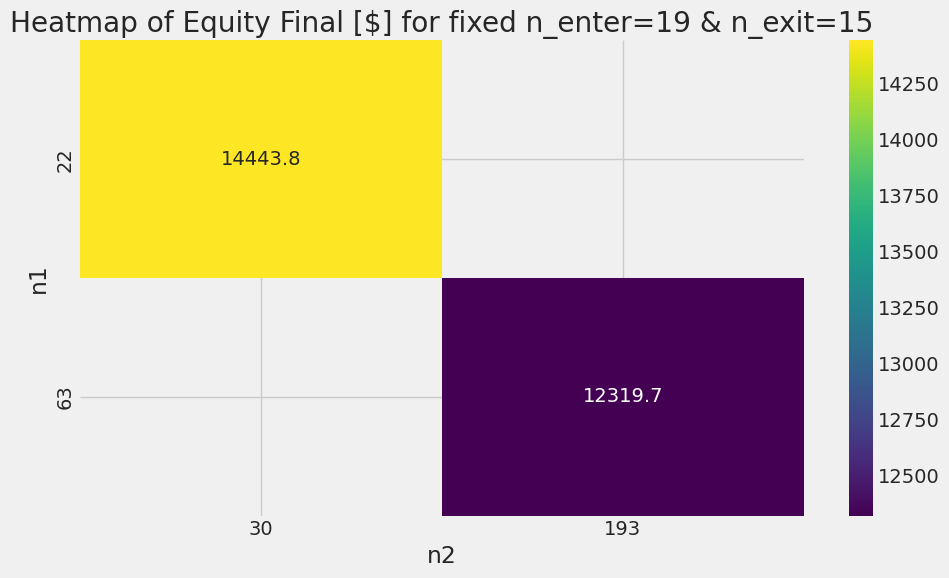

In [134]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd # Import pandas

# Assuming 'heatmap' is already loaded as a pandas Series
# If not, you might need to reload or ensure it's accessible

# Convert heatmap Series to DataFrame
heatmap_df = heatmap.reset_index()

# Print unique values of n_enter and n_exit to see available options
print("Unique n_enter values:", heatmap_df['n_enter'].unique())
print("Unique n_exit values:", heatmap_df['n_exit'].unique())

# Choose an existing combination of n_enter and n_exit for filtering.
# Replace 'existing_n_enter' and 'existing_n_exit' with values
# that were printed in the console.
# For example, if the unique values printed include 10 and 15, you could use:
# chosen_n_enter = 10
# chosen_n_exit = 15

# **Replace these with values from the unique lists printed above**
# If no combinations exist, you might need to re-run the optimization
# with different ranges or max_tries, or choose a different visualization method.
try:
    # Attempt to find the combination closest to 20 and 15 if they don't exist
    chosen_n_enter = min(heatmap_df['n_enter'].unique(), key=lambda x:abs(x-20))
    chosen_n_exit = min(heatmap_df['n_exit'].unique(), key=lambda x:abs(x-15))
    print(f"\nUsing existing combination: n_enter={chosen_n_enter}, n_exit={chosen_n_exit}")

    # Step 2: Filter for the chosen n_enter and n_exit
    filtered_df = heatmap_df[(heatmap_df['n_enter'] == chosen_n_enter) & (heatmap_df['n_exit'] == chosen_n_exit)]

    # Check if the filtered DataFrame is empty
    if filtered_df.empty:
        print(f"Filtered DataFrame is empty for n_enter={chosen_n_enter} and n_exit={chosen_n_exit}.")
        print("Cannot plot heatmap for this combination.")
    else:
        # Step 3: Pivot table to create 2D grid of n1 vs n2
        # Use aggfunc='mean' in case there are multiple entries for the same n1/n2 combination
        pivot = filtered_df.pivot_table(index='n1', columns='n2', values='Equity Final [$]', aggfunc='mean')

        # Step 4: Plot heatmap
        plt.figure(figsize=(10, 6))
        sns.heatmap(pivot, annot=True, fmt=".1f", cmap="viridis")
        plt.title(f"Heatmap of Equity Final [$] for fixed n_enter={chosen_n_enter} & n_exit={chosen_n_exit}")
        plt.xlabel("n2")
        plt.ylabel("n1")
        plt.tight_layout()
        plt.show()

except Exception as e:
    print(f"An error occurred during filtering or plotting: {e}")
    print("Please check the unique values printed above and ensure you are using a valid combination for filtering.")